In [1]:
!pip install -qU portalocker

In [2]:
import torch, torchtext

In [3]:
torch.__version__, torchtext.__version__

('2.0.1+cu118', '0.15.2+cpu')

# Populate vocabulary

In [4]:
from torch.utils.data import DataLoader

In [5]:
train_dataset, test_dataset = torchtext.datasets.AG_NEWS()

In [6]:
from torchtext.data import get_tokenizer
from torchtext.vocab import build_vocab_from_iterator

In [7]:
list(train_dataset)[0]

(3,
 "Wall St. Bears Claw Back Into the Black (Reuters) Reuters - Short-sellers, Wall Street's dwindling\\band of ultra-cynics, are seeing green again.")

In [8]:
tokenizer = get_tokenizer("basic_english")

def build_vocabulary(datasets):
  for dataset in datasets:
    for _, text in dataset:
      yield tokenizer(text)

vocab = build_vocab_from_iterator(
    build_vocabulary([train_dataset, test_dataset]),
    min_freq=1,
    specials=["<UNK>"]
)

vocab.set_default_index(vocab["<UNK>"])

In [9]:
len(vocab)

98635

In [10]:
tokens = tokenizer("Hello how are you?, I am Ronit!")
indexes = vocab(tokens)
tokens, indexes, vocab.lookup_tokens(indexes)

(['hello', 'how', 'are', 'you', '?', ',', 'i', 'am', 'ronit', '!'],
 [12388, 355, 42, 164, 80, 3, 281, 1953, 0, 747],
 ['hello', 'how', 'are', 'you', '?', ',', 'i', 'am', '<UNK>', '!'])

# Approach 1: Single LSTM layer
1. Tokens per text example: 25
2. Embeddings Length: 50
3. LSTM output: 75

In [11]:
from torch.utils.data import DataLoader
from torchtext.data.functional import to_map_style_dataset

train_dataset, test_dataset  = torchtext.datasets.AG_NEWS()
train_dataset, test_dataset  = to_map_style_dataset(train_dataset), to_map_style_dataset(test_dataset)

target_classes = ["World", "Sports", "Business", "Sci/Tech"]

max_words = 25

def vectorize_batch(batch):
    Y, X = list(zip(*batch))
    X = [vocab(tokenizer(text)) for text in X] ## Tokenize and map tokens to indexes
    X = [tokens+([0]* (max_words-len(tokens))) if len(tokens)<max_words else tokens[:max_words] for tokens in X] ## Bringing all samples to max_words length.

    return torch.tensor(X, dtype=torch.int32), torch.tensor(Y) - 1 ## We have deducted 1 from target names to get them in range [0,1,2,3] from [1,2,3,4]


train_loader = DataLoader(train_dataset, batch_size=1024, collate_fn=vectorize_batch, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1024, collate_fn=vectorize_batch)

In [12]:
for X, Y in train_loader:
  print(X.shape, Y.shape)
  break

torch.Size([1024, 25]) torch.Size([1024])


In [13]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [21]:
from torch import nn
from torch.nn import functional as F

embed_len = 50
hidden_dim = 75
n_layers = 1

class LSTMClassifier(nn.Module):
  def __init__(self, embed_len, hidden_dim, n_layers, n_classes):
    super(LSTMClassifier, self).__init__()
    self.embedding_layer = nn.Embedding(len(vocab), embed_len)
    self.lstm = nn.LSTM(embed_len, hidden_dim, num_layers=n_layers, batch_first=True)
    self.linear = nn.Linear(hidden_dim, n_classes)

  def forward(self, x):
    embeddings = self.embedding_layer(x)
    h0 = torch.randn(n_layers, len(x), hidden_dim).to(device)
    c0 = torch.randn(n_layers, len(x), hidden_dim).to(device)

    out, (h, c) = self.lstm(embeddings, (h0, c0))

    return self.linear(out[:, -1])

In [22]:
model = LSTMClassifier(embed_len=embed_len, hidden_dim=hidden_dim, n_layers=n_layers, n_classes=4)
model = model.to(device)

In [23]:
for layer in model.children():
  print(f"Layer: {layer}")
  print("Parameters: ")
  for param in layer.parameters():
    print(param.shape)


Layer: Embedding(98635, 50)
Parameters: 
torch.Size([98635, 50])
Layer: LSTM(50, 75, batch_first=True)
Parameters: 
torch.Size([300, 50])
torch.Size([300, 75])
torch.Size([300])
torch.Size([300])
Layer: Linear(in_features=75, out_features=4, bias=True)
Parameters: 
torch.Size([4, 75])
torch.Size([4])


In [24]:
from tqdm import tqdm
from sklearn.metrics import accuracy_score
import gc

def ValLossAndAccuracy(model, loss_fn, val_loader):
  with torch.inference_mode():
    y_shuffled, y_preds, losses = [], [], []
    for x, y in val_loader:
      preds = model(x.to(device))
      loss = loss_fn(preds, y.to(device))
      losses.append(loss.item())

      y_shuffled.append(y)
      y_preds.append(preds.argmax(dim=-1))

    y_shuffled = torch.cat(y_shuffled)
    y_preds = torch.cat(y_preds)

    print(f"Val Loss: {torch.tensor(losses).mean():.3f}")
    print(f"Val accuracy: {accuracy_score(y_shuffled.detach().cpu().numpy(), y_preds.detach().cpu().numpy()):.3f}")

def TrainModel(model, loss_fn, optimizer, train_loader, val_loader, epochs=10):
  for i in range(epochs):
    losses = []
    for x, y in tqdm(train_loader):
      y_preds = model(x.to(device))

      loss = loss_fn(y_preds, y.to(device))
      losses.append(loss)

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

    print(f"Train loss: {torch.tensor(losses).mean():.3f}")
    ValLossAndAccuracy(model, loss_fn, val_loader)


In [25]:
from torch.optim import Adam

epochs = 10
learning_rate = 1e-3

model = LSTMClassifier(embed_len=embed_len, hidden_dim=hidden_dim, n_layers=n_layers, n_classes=4)
model = model.to(device)
loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(params=model.parameters(),lr=learning_rate)

In [26]:
TrainModel(model, loss_fn, optimizer, train_loader, test_loader, epochs)

100%|██████████| 118/118 [00:05<00:00, 19.93it/s]


Train loss: 1.175
Val Loss: 0.858
Val accuracy: 0.670


100%|██████████| 118/118 [00:05<00:00, 22.97it/s]


Train loss: 0.672
Val Loss: 0.575
Val accuracy: 0.789


100%|██████████| 118/118 [00:07<00:00, 16.68it/s]


Train loss: 0.490
Val Loss: 0.483
Val accuracy: 0.820


100%|██████████| 118/118 [00:05<00:00, 23.05it/s]


Train loss: 0.406
Val Loss: 0.433
Val accuracy: 0.843


100%|██████████| 118/118 [00:06<00:00, 19.37it/s]


Train loss: 0.352
Val Loss: 0.397
Val accuracy: 0.858


100%|██████████| 118/118 [00:05<00:00, 22.80it/s]


Train loss: 0.312
Val Loss: 0.377
Val accuracy: 0.866


100%|██████████| 118/118 [00:06<00:00, 19.34it/s]


Train loss: 0.281
Val Loss: 0.365
Val accuracy: 0.874


100%|██████████| 118/118 [00:07<00:00, 16.29it/s]


Train loss: 0.254
Val Loss: 0.354
Val accuracy: 0.877


100%|██████████| 118/118 [00:07<00:00, 15.80it/s]


Train loss: 0.234
Val Loss: 0.344
Val accuracy: 0.881


100%|██████████| 118/118 [00:09<00:00, 12.07it/s]


Train loss: 0.214
Val Loss: 0.354
Val accuracy: 0.881


In [27]:
def MakePredictions(model, loader):
  y_shuffled, y_preds = [], []
  for x, y in loader:
    with torch.inference_mode():
      preds = model(x.to(device))
      y_preds.append(preds)
      y_shuffled.append(y)
  gc.collect()
  y_preds, y_shuffled = torch.cat(y_preds), torch.cat(y_shuffled)

  return y_shuffled.detach().numpy(), F.softmax(y_preds, dim=-1).argmax(dim=-1).detach().cpu().numpy()

y_actual, y_preds = MakePredictions(model, test_loader)


In [28]:
def model_report(y, y_preds):
  from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

  print(f"Test Accuracy: {accuracy_score(y, y_preds)}")
  print("\nClassification Report:")
  print(classification_report(y, y_preds, target_names=target_classes))
  print("\nConfusion Matrix: ")
  print(confusion_matrix(y, y_preds))

In [29]:
model_report(y_actual, y_preds)

Test Accuracy: 0.8827631578947368

Classification Report:
              precision    recall  f1-score   support

       World       0.91      0.87      0.89      1900
      Sports       0.93      0.96      0.94      1900
    Business       0.84      0.85      0.84      1900
    Sci/Tech       0.86      0.84      0.85      1900

    accuracy                           0.88      7600
   macro avg       0.88      0.88      0.88      7600
weighted avg       0.88      0.88      0.88      7600


Confusion Matrix: 
[[1662   66   89   83]
 [  30 1819   32   19]
 [  75   36 1623  166]
 [  61   36  198 1605]]


In [30]:
def plot_confusion_matrix(y, y_preds):
  from sklearn.metrics import confusion_matrix
  import seaborn as sns
  import numpy as np

  cf_matrix = confusion_matrix(y_actual, y_preds)

  sns.heatmap(
      cf_matrix/np.sum(cf_matrix, axis=-1),
      xticklabels=target_classes,
      yticklabels=target_classes,
      annot=True,
      fmt='.2%',
      cmap="Blues",
      )

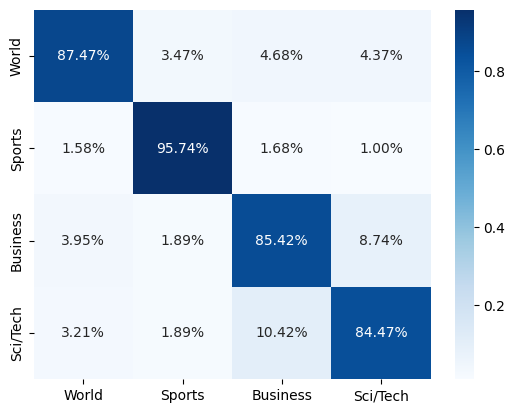

In [31]:
plot_confusion_matrix(y_actual, y_preds)

In [32]:
!pip install -qU lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [33]:
X_test_text, Y_test = [], []
for Y, X in test_dataset:
    X_test_text.append(X)
    Y_test.append(Y-1)

len(X_test_text)

7600

In [34]:
# Using LIME algorithm to exaplain predictions of black-box neural network model
# Helps to create visualization explaining words that contibute to predicting a particular target label

from lime import lime_text
import numpy as np

explainer = lime_text.LimeTextExplainer(class_names=target_classes, verbose=True)

def make_predictions(X_batch_text):
  x = [vocab(tokenizer(text)) for text in X_batch_text]
  x = [tokens+([0]* (max_words-len(tokens))) if len(tokens)<max_words else tokens[:max_words] for tokens in x]
  logits = model(torch.tensor(x, dtype=torch.int32).to(device))
  preds = F.softmax(logits, dim=-1)
  return preds.detach().cpu().numpy()

## Randomly Select test example and make prediction on it.
rng = np.random.RandomState(1)
idx = rng.randint(1, len(X_test_text))
X = [vocab(tokenizer(text)) for text in X_test_text[idx:idx+1]]
X = [tokens+([0]* (max_words-len(tokens))) if len(tokens)<max_words else tokens[:max_words] for tokens in X] ## Bringing all samples to max_words length.
preds = model(torch.tensor(X, dtype=torch.int32).to(device))
preds = F.softmax(preds, dim=-1)

print("Prediction : ", target_classes[preds.argmax()])
print("Actual :     ", target_classes[Y_test[idx]])

Prediction :  Business
Actual :      Business


In [35]:
explanation = explainer.explain_instance(X_test_text[idx], classifier_fn=make_predictions,
                                         labels=Y_test[idx:idx+1])
explanation.show_in_notebook()

Intercept 0.8825212868339787
Prediction_local [0.99568629]
Right: 0.98909175


In [20]:
import pandas as pd

In [52]:
results = {}
def add_result(text):
  from sklearn.metrics import accuracy_score

  y, y_preds = MakePredictions(model, test_loader)
  results[text] = accuracy_score(y, y_preds)
  df = pd.DataFrame.from_dict(results, orient = "index", columns=["Accuracy_score"])
  print(df)

text = "SINGLE LSTM(25, 50, 75)"
add_result(text)

                         Accuracy_score
SINGLE LSTM(25, 50, 75)        0.881053


# Approach 2: Single LSTM layer
1. Tokens per text example: 50
2. Embeddings Length: 50
3. LSTM output: 75

In [53]:
from torch.utils.data import DataLoader
from torchtext.data.functional import to_map_style_dataset

train_dataset, test_dataset = torchtext.datasets.AG_NEWS()
train_dataset = to_map_style_dataset(train_dataset)
test_dataset = to_map_style_dataset(test_dataset)

target_classes = ["World", "Sports", "Business", "Sci/Tech"]

max_words = 50

train_loader = DataLoader(train_dataset, batch_size=1024, collate_fn=vectorize_batch, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1024, collate_fn=vectorize_batch)

In [54]:
for x, y in train_loader:
  print(x.shape, y.shape)
  break

torch.Size([1024, 50]) torch.Size([1024])


In [55]:
from torch import nn
from torch.nn import functional as F

embed_dim = 50
hidden_dim = 75
n_layers = 1

class Model(nn.Module):
  def __init__(self, embed_size, hidden_size, n_layers):
    super(Model, self).__init__()
    self.hidden_size = hidden_size
    self.embedding_layer = nn.Embedding(len(vocab), embed_size)
    self.lstm = nn.LSTM(embed_size, hidden_size, batch_first=True)
    self.linear = nn.Linear(hidden_size, len(target_classes))

  def forward(self, x):
    embeddings = self.embedding_layer(x)
    h_0 = torch.randn(n_layers, len(x), self.hidden_size).to(device)
    c_0 = torch.randn(n_layers, len(x), self.hidden_size).to(device)

    out, (h, c) = self.lstm(embeddings, (h_0, c_0))

    return self.linear(out[:, -1])

In [56]:
from torch.optim import Adam

epochs = 10
learning_rate = 1e-3

loss_fn = nn.CrossEntropyLoss()
model = Model(embed_dim, hidden_dim, n_layers)
model = model.to(device)
optimizer = Adam(
    params=model.parameters(),
    lr=learning_rate
)

In [57]:
TrainModel(model, loss_fn, optimizer, train_loader, test_loader, epochs)

100%|██████████| 118/118 [00:08<00:00, 14.04it/s]


Train loss: 1.310
Val Loss: 1.057
Val accuracy: 0.562


100%|██████████| 118/118 [00:08<00:00, 14.01it/s]


Train loss: 0.768
Val Loss: 0.615
Val accuracy: 0.771


100%|██████████| 118/118 [00:09<00:00, 12.42it/s]


Train loss: 0.507
Val Loss: 0.493
Val accuracy: 0.819


100%|██████████| 118/118 [00:12<00:00,  9.31it/s]


Train loss: 0.409
Val Loss: 0.429
Val accuracy: 0.848


100%|██████████| 118/118 [00:07<00:00, 16.37it/s]


Train loss: 0.353
Val Loss: 0.413
Val accuracy: 0.852


100%|██████████| 118/118 [00:06<00:00, 17.60it/s]


Train loss: 0.316
Val Loss: 0.380
Val accuracy: 0.869


100%|██████████| 118/118 [00:06<00:00, 17.66it/s]


Train loss: 0.284
Val Loss: 0.365
Val accuracy: 0.872


100%|██████████| 118/118 [00:07<00:00, 16.15it/s]


Train loss: 0.258
Val Loss: 0.355
Val accuracy: 0.880


100%|██████████| 118/118 [00:06<00:00, 18.84it/s]


Train loss: 0.238
Val Loss: 0.349
Val accuracy: 0.881


100%|██████████| 118/118 [00:07<00:00, 16.16it/s]


Train loss: 0.219
Val Loss: 0.350
Val accuracy: 0.887


In [58]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
y_actual, y_preds = MakePredictions(model, test_loader)
y_actual.shape, y_preds.shape

((7600,), (7600,))

In [59]:
model_report(y_actual, y_preds)

Test Accuracy: 0.8860526315789473

Classification Report:
              precision    recall  f1-score   support

       World       0.91      0.88      0.89      1900
      Sports       0.94      0.94      0.94      1900
    Business       0.86      0.85      0.86      1900
    Sci/Tech       0.84      0.87      0.85      1900

    accuracy                           0.89      7600
   macro avg       0.89      0.89      0.89      7600
weighted avg       0.89      0.89      0.89      7600


Confusion Matrix: 
[[1677   65   96   62]
 [  43 1795    6   56]
 [  67   13 1614  206]
 [  62   31  159 1648]]


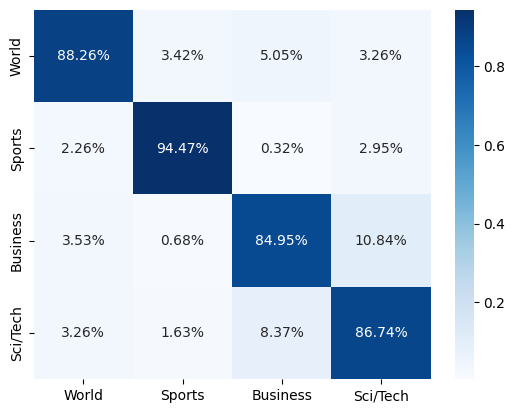

In [60]:
plot_confusion_matrix(y_actual, y_preds)

In [61]:
from lime import lime_text
import numpy as np

explainer = lime_text.LimeTextExplainer(class_names=target_classes, verbose=True)

rng = np.random.RandomState(1)
idx = rng.randint(1, len(X_test_text))
X = [vocab(tokenizer(text)) for text in X_test_text[idx:idx+1]]
X = [tokens+([0]* (max_words-len(tokens))) if len(tokens)<max_words else tokens[:max_words] for tokens in X] ## Bringing all samples to max_words length.
preds = model(torch.tensor(X, dtype=torch.int32).to(device))
preds = F.softmax(preds, dim=-1)

print("Prediction : ", target_classes[preds.argmax()])
print("Actual :     ", target_classes[Y_test[idx]])

explaination = explainer.explain_instance(X_test_text[idx], classifier_fn=make_predictions,
                                         labels=Y_test[idx:idx+1])

explaination.show_in_notebook()

Prediction :  Business
Actual :      Business
Intercept 0.4038677716760531
Prediction_local [1.01333393]
Right: 0.9589806


In [62]:
text = "SINGLE LSTM(50, 50, 75)"
add_result(text)

                         Accuracy_score
SINGLE LSTM(25, 50, 75)        0.881053
SINGLE LSTM(50, 50, 75)        0.885526


# Approach 3: Multiple LSTM layer
1. Tokens per text example: 50
2. Embeddings Length: 50
3. LSTM output: 75

In [63]:
from torch import nn
from torch.nn import functional as F

embed_len = 50
hidden_dim = 75
n_layers = 3

class Model(nn.Module):
  def __init__(self, embed_size, hidden_size, n_layers):
    super(Model, self).__init__()
    self.hidden_size = hidden_size
    self.embedding_layer = nn.Embedding(len(vocab), embed_size)
    self.lstm = nn.LSTM(embed_size, hidden_size, num_layers=n_layers, batch_first=True)
    self.linear = nn.Linear(hidden_size, len(target_classes))

  def forward(self, x):
    embeddings = self.embedding_layer(x)

    h_0 = torch.randn(n_layers, len(x), self.hidden_size).to(device)
    c_0 = torch.randn(n_layers, len(x), self.hidden_size).to(device)

    out, (h, c) = self.lstm(embeddings, (h_0, c_0))

    return self.linear(out[:, -1])

In [64]:
model = Model(embed_len, hidden_dim, n_layers)
model = model.to(device)

In [65]:
for layer in model.children():
  print("Layer: ", layer)
  print("Parameters: ")
  for param in layer.parameters():
    print(param.shape)
  print()

Layer:  Embedding(98635, 50)
Parameters: 
torch.Size([98635, 50])

Layer:  LSTM(50, 75, num_layers=3, batch_first=True)
Parameters: 
torch.Size([300, 50])
torch.Size([300, 75])
torch.Size([300])
torch.Size([300])
torch.Size([300, 75])
torch.Size([300, 75])
torch.Size([300])
torch.Size([300])
torch.Size([300, 75])
torch.Size([300, 75])
torch.Size([300])
torch.Size([300])

Layer:  Linear(in_features=75, out_features=4, bias=True)
Parameters: 
torch.Size([4, 75])
torch.Size([4])



In [66]:
from torch.optim import Adam

epochs = 10
learning_rate = 1e-3

loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(
    params = model.parameters(),
    lr=learning_rate
)

In [67]:
TrainModel(model, loss_fn, optimizer, train_loader, test_loader)

100%|██████████| 118/118 [00:09<00:00, 12.21it/s]


Train loss: 1.220
Val Loss: 0.918
Val accuracy: 0.624


100%|██████████| 118/118 [00:11<00:00, 10.48it/s]


Train loss: 0.704
Val Loss: 0.582
Val accuracy: 0.780


100%|██████████| 118/118 [00:13<00:00,  9.02it/s]


Train loss: 0.495
Val Loss: 0.471
Val accuracy: 0.831


100%|██████████| 118/118 [00:10<00:00, 11.25it/s]


Train loss: 0.398
Val Loss: 0.412
Val accuracy: 0.853


100%|██████████| 118/118 [00:09<00:00, 11.80it/s]


Train loss: 0.341
Val Loss: 0.382
Val accuracy: 0.865


100%|██████████| 118/118 [00:13<00:00,  9.00it/s]


Train loss: 0.297
Val Loss: 0.356
Val accuracy: 0.876


100%|██████████| 118/118 [00:11<00:00, 10.21it/s]


Train loss: 0.269
Val Loss: 0.341
Val accuracy: 0.880


100%|██████████| 118/118 [00:13<00:00,  8.87it/s]


Train loss: 0.241
Val Loss: 0.330
Val accuracy: 0.885


100%|██████████| 118/118 [00:13<00:00,  8.74it/s]


Train loss: 0.221
Val Loss: 0.339
Val accuracy: 0.892


100%|██████████| 118/118 [00:12<00:00,  9.44it/s]


Train loss: 0.201
Val Loss: 0.334
Val accuracy: 0.890


In [68]:
y_actual, y_preds = MakePredictions(model, test_loader)
y_actual.shape, y_preds.shape

((7600,), (7600,))

In [69]:
model_report(y_actual, y_preds)

Test Accuracy: 0.8882894736842105

Classification Report:
              precision    recall  f1-score   support

       World       0.90      0.90      0.90      1900
      Sports       0.94      0.95      0.95      1900
    Business       0.84      0.86      0.85      1900
    Sci/Tech       0.86      0.84      0.85      1900

    accuracy                           0.89      7600
   macro avg       0.89      0.89      0.89      7600
weighted avg       0.89      0.89      0.89      7600


Confusion Matrix: 
[[1706   64   80   50]
 [  34 1812   18   36]
 [  87   15 1631  167]
 [  60   32  206 1602]]


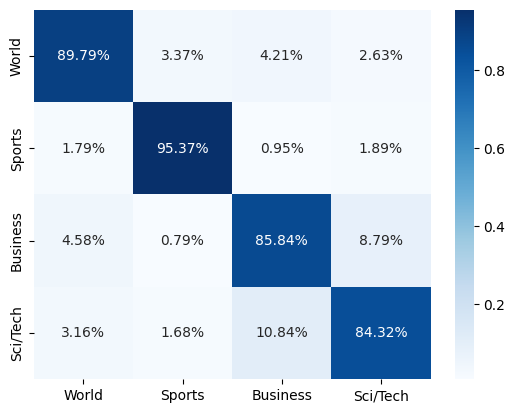

In [70]:
plot_confusion_matrix(y_actual, y_preds)

In [71]:
from lime import lime_text
import numpy as np

explainer = lime_text.LimeTextExplainer(class_names=target_classes, verbose=True)

rng = np.random.RandomState(1)
idx = rng.randint(1, len(X_test_text))
X = [vocab(tokenizer(text)) for text in X_test_text[idx:idx+1]]
X = [tokens+([0]* (max_words-len(tokens))) if len(tokens)<max_words else tokens[:max_words] for tokens in X] ## Bringing all samples to max_words length.
preds = model(torch.tensor(X, dtype=torch.int32).to(device))
preds = F.softmax(preds, dim=-1)

print("Prediction : ", target_classes[preds.argmax()])
print("Actual :     ", target_classes[Y_test[idx]])

explanation = explainer.explain_instance(X_test_text[idx], classifier_fn=make_predictions,
                                         labels=Y_test[idx:idx+1])
explanation.show_in_notebook()

Prediction :  Business
Actual :      Business
Intercept 0.46413270827493436
Prediction_local [1.04582995]
Right: 0.9655428


In [72]:
text = "Multiple LSTM(50, 50, 75)"
add_result(text)

                           Accuracy_score
SINGLE LSTM(25, 50, 75)          0.881053
SINGLE LSTM(50, 50, 75)          0.885526
Multiple LSTM(50, 50, 75)        0.889474


# Approach 4: Stack Multiple LSTM layer (different dimensions)
1. Tokens per text example: 50
2. Embeddings Length: 50
3. LSTM output: 75

In [88]:
from torch import nn
from torch.nn import functional as F

embed_len = 50
hidden_dim1 = 50
hidden_dim2 = 60
hidden_dim3 = 75
n_layers = 1

class Model(nn.Module):
  def __init__(self, embed_len, hidden_dim1, hidden_dim2, hidden_dim3, n_layers):
    super(Model,self).__init__()
    self.hd1 = hidden_dim1
    self.hd2 = hidden_dim2
    self.hd3 = hidden_dim3

    self.embedding_layer = nn.Embedding(len(vocab), embed_len)
    self.lstm1 = nn.LSTM(embed_len, hidden_dim1, num_layers=n_layers, batch_first=True)
    self.lstm2 = nn.LSTM(hidden_dim1, hidden_dim2, num_layers=n_layers, batch_first=True)
    self.lstm3 = nn.LSTM(hidden_dim2, hidden_dim3, num_layers=n_layers, batch_first=True)
    self.linear = nn.Linear(hidden_dim3, len(target_classes))

  def forward(self, x):
    embeddings = self.embedding_layer(x)

    h_0 = torch.randn(n_layers, len(x), self.hd1).to(device)
    c_0 = torch.randn(n_layers, len(x), self.hd1).to(device)
    out, _ = self.lstm1(embeddings, (h_0, c_0))

    h_0 = torch.randn(n_layers, len(x), self.hd2).to(device)
    c_0 = torch.randn(n_layers, len(x), self.hd2).to(device)
    out, _ = self.lstm2(out, (h_0, c_0))

    h_0 = torch.randn(n_layers, len(x), self.hd3).to(device)
    c_0 = torch.randn(n_layers, len(x), self.hd3).to(device)
    out, _ = self.lstm3(out, (h_0, c_0))

    return self.linear(out[:, -1])

In [89]:
model = Model(embed_len, hidden_dim1, hidden_dim2, hidden_dim3, n_layers)
model = model.to(device)
model

Model(
  (embedding_layer): Embedding(98635, 50)
  (lstm1): LSTM(50, 50, batch_first=True)
  (lstm2): LSTM(50, 60, batch_first=True)
  (lstm3): LSTM(60, 75, batch_first=True)
  (linear): Linear(in_features=75, out_features=4, bias=True)
)

In [90]:
for layer in model.children():
  print(f"Layer: {layer}")
  print("Parameters: ")
  for param in layer.parameters():
    print(param.shape)
  print()


Layer: Embedding(98635, 50)
Parameters: 
torch.Size([98635, 50])

Layer: LSTM(50, 50, batch_first=True)
Parameters: 
torch.Size([200, 50])
torch.Size([200, 50])
torch.Size([200])
torch.Size([200])

Layer: LSTM(50, 60, batch_first=True)
Parameters: 
torch.Size([240, 50])
torch.Size([240, 60])
torch.Size([240])
torch.Size([240])

Layer: LSTM(60, 75, batch_first=True)
Parameters: 
torch.Size([300, 60])
torch.Size([300, 75])
torch.Size([300])
torch.Size([300])

Layer: Linear(in_features=75, out_features=4, bias=True)
Parameters: 
torch.Size([4, 75])
torch.Size([4])



In [91]:
from torch.optim import Adam

epochs=10
learning_rate=1e-3

loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(
    params=model.parameters(),
    lr=learning_rate
  )

In [92]:
TrainModel(model, loss_fn, optimizer, train_loader, test_loader)

100%|██████████| 118/118 [00:06<00:00, 16.94it/s]


Train loss: 1.251
Val Loss: 1.028
Val accuracy: 0.525


100%|██████████| 118/118 [00:07<00:00, 15.02it/s]


Train loss: 0.848
Val Loss: 0.702
Val accuracy: 0.727


100%|██████████| 118/118 [00:08<00:00, 14.47it/s]


Train loss: 0.560
Val Loss: 0.510
Val accuracy: 0.815


100%|██████████| 118/118 [00:06<00:00, 17.10it/s]


Train loss: 0.431
Val Loss: 0.431
Val accuracy: 0.850


100%|██████████| 118/118 [00:10<00:00, 10.79it/s]


Train loss: 0.357
Val Loss: 0.388
Val accuracy: 0.867


100%|██████████| 118/118 [00:15<00:00,  7.52it/s]


Train loss: 0.309
Val Loss: 0.372
Val accuracy: 0.871


100%|██████████| 118/118 [00:10<00:00, 11.24it/s]


Train loss: 0.276
Val Loss: 0.351
Val accuracy: 0.882


100%|██████████| 118/118 [00:07<00:00, 14.96it/s]


Train loss: 0.251
Val Loss: 0.337
Val accuracy: 0.888


100%|██████████| 118/118 [00:10<00:00, 10.75it/s]


Train loss: 0.232
Val Loss: 0.322
Val accuracy: 0.895


100%|██████████| 118/118 [00:11<00:00, 10.36it/s]


Train loss: 0.208
Val Loss: 0.325
Val accuracy: 0.894


In [93]:
y_actual, y_preds = MakePredictions(model, test_loader)
y_actual.shape, y_preds.shape

((7600,), (7600,))

In [95]:
model_report(y_actual, y_preds)

Test Accuracy: 0.8923684210526316

Classification Report:
              precision    recall  f1-score   support

       World       0.93      0.87      0.90      1900
      Sports       0.94      0.97      0.95      1900
    Business       0.86      0.85      0.86      1900
    Sci/Tech       0.85      0.88      0.86      1900

    accuracy                           0.89      7600
   macro avg       0.89      0.89      0.89      7600
weighted avg       0.89      0.89      0.89      7600


Confusion Matrix: 
[[1653   67  110   70]
 [  18 1838   17   27]
 [  57   16 1618  209]
 [  55   36  136 1673]]


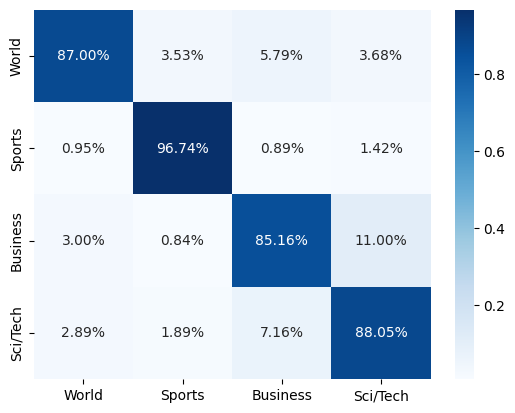

In [96]:
plot_confusion_matrix(y_actual, y_preds)

In [98]:

from lime import lime_text
import numpy as np

explainer = lime_text.LimeTextExplainer(class_names=target_classes, verbose=True)

rng = np.random.RandomState(1)
idx = rng.randint(1, len(X_test_text))
X = [vocab(tokenizer(text)) for text in X_test_text[idx:idx+1]]
X = [tokens+([0]* (max_words-len(tokens))) if len(tokens)<max_words else tokens[:max_words] for tokens in X] ## Bringing all samples to max_words length.
preds = model(torch.tensor(X, dtype=torch.int32).to(device))
preds = F.softmax(preds, dim=-1)

print("Prediction : ", target_classes[preds.argmax()])
print("Actual :     ", target_classes[Y_test[idx]])

explanation = explainer.explain_instance(X_test_text[idx], classifier_fn=make_predictions,
                                         labels=Y_test[idx:idx+1])
explanation.show_in_notebook()

Prediction :  Business
Actual :      Business
Intercept 0.5893628839604689
Prediction_local [1.03141644]
Right: 0.98343176


In [100]:
text = "MULTIPLE LSTM(50, 50, 60, 75)"
add_result(text)

                               Accuracy_score
SINGLE LSTM(25, 50, 75)              0.881053
SINGLE LSTM(50, 50, 75)              0.885526
Multiple LSTM(50, 50, 75)            0.889474
MULTIPLE LSTM(50, 50, 60, 75)        0.896316


# Approach 5: Stack Multiple LSTM layer (Bidirectional)
1. Tokens per text example: 50
2. Embeddings Length: 50
3. LSTM output: 75

In [111]:
from torch import nn
from torch.nn import functional

embed_len = 50
hidden_len = 75
n_layers = 3

class Model(nn.Module):
  def __init__(self, embed_size, hidden_size, n_layers):
    super(Model, self).__init__()
    self.hidden_size = hidden_size
    self.embedding_layer = nn.Embedding(len(vocab), embed_size)
    self.lstm = nn.LSTM(embed_size, hidden_size, num_layers=n_layers, batch_first=True, bidirectional=True)
    self.linear = nn.Linear(2*hidden_size, len(target_classes))

  def forward(self, x):
    embeddings = self.embedding_layer(x)

    h_0 = torch.randn(2*n_layers, len(x), self.hidden_size).to(device)
    c_0 = torch.randn(2*n_layers, len(x), self.hidden_size).to(device)

    out, _ = self.lstm(embeddings, (h_0, c_0))

    return self.linear(out[:, -1])

In [112]:
model = Model(embed_len, hidden_len, n_layers)
model = model.to(device)
model

Model(
  (embedding_layer): Embedding(98635, 50)
  (lstm): LSTM(50, 75, num_layers=3, batch_first=True, bidirectional=True)
  (linear): Linear(in_features=150, out_features=4, bias=True)
)

In [113]:
from torch.optim import Adam

epochs = 10
learning_rate =1e-3

loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(
    params=model.parameters(),
    lr=learning_rate
)

In [114]:
TrainModel(model, loss_fn, optimizer, train_loader, test_loader)

100%|██████████| 118/118 [00:12<00:00,  9.48it/s]


Train loss: 1.205
Val Loss: 0.963
Val accuracy: 0.551


100%|██████████| 118/118 [00:14<00:00,  7.97it/s]


Train loss: 0.790
Val Loss: 0.651
Val accuracy: 0.737


100%|██████████| 118/118 [00:19<00:00,  5.92it/s]


Train loss: 0.528
Val Loss: 0.463
Val accuracy: 0.831


100%|██████████| 118/118 [00:17<00:00,  6.67it/s]


Train loss: 0.393
Val Loss: 0.393
Val accuracy: 0.857


100%|██████████| 118/118 [00:17<00:00,  6.85it/s]


Train loss: 0.324
Val Loss: 0.367
Val accuracy: 0.872


100%|██████████| 118/118 [00:14<00:00,  8.16it/s]


Train loss: 0.279
Val Loss: 0.330
Val accuracy: 0.883


100%|██████████| 118/118 [00:12<00:00,  9.27it/s]


Train loss: 0.248
Val Loss: 0.331
Val accuracy: 0.879


100%|██████████| 118/118 [00:12<00:00,  9.65it/s]


Train loss: 0.222
Val Loss: 0.307
Val accuracy: 0.896


100%|██████████| 118/118 [00:12<00:00,  9.71it/s]


Train loss: 0.199
Val Loss: 0.315
Val accuracy: 0.893


100%|██████████| 118/118 [00:12<00:00,  9.69it/s]


Train loss: 0.181
Val Loss: 0.315
Val accuracy: 0.897


In [115]:
y_actual, y_preds = MakePredictions(model, test_loader)
y_actual.shape, y_preds.shape

((7600,), (7600,))

In [116]:
model_report(y_actual, y_preds)

Test Accuracy: 0.895

Classification Report:
              precision    recall  f1-score   support

       World       0.90      0.90      0.90      1900
      Sports       0.93      0.97      0.95      1900
    Business       0.91      0.81      0.86      1900
    Sci/Tech       0.85      0.89      0.87      1900

    accuracy                           0.90      7600
   macro avg       0.90      0.90      0.89      7600
weighted avg       0.90      0.90      0.89      7600


Confusion Matrix: 
[[1716   66   54   64]
 [  29 1847    7   17]
 [  99   26 1546  229]
 [  73   39   95 1693]]


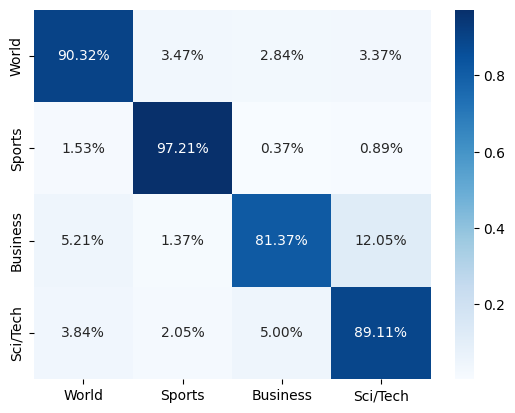

In [118]:
plot_confusion_matrix(y_actual, y_preds)

In [119]:
from lime import lime_text
import numpy as np

explainer = lime_text.LimeTextExplainer(class_names=target_classes, verbose=True)

rng = np.random.RandomState(1)
idx = rng.randint(1, len(X_test_text))
X = [vocab(tokenizer(text)) for text in X_test_text[idx:idx+1]]
X = [tokens+([0]* (max_words-len(tokens))) if len(tokens)<max_words else tokens[:max_words] for tokens in X] ## Bringing all samples to max_words length.
preds = model(torch.tensor(X, dtype=torch.int32).to(device))
preds = F.softmax(preds, dim=-1)

print("Prediction : ", target_classes[preds.argmax()])
print("Actual :     ", target_classes[Y_test[idx]])

explanation = explainer.explain_instance(X_test_text[idx], classifier_fn=make_predictions,
                                         labels=Y_test[idx:idx+1])
explanation.show_in_notebook()

Prediction :  Business
Actual :      Business
Intercept 0.2257429008580708
Prediction_local [1.05495103]
Right: 0.9790045


In [120]:
text = "MULTIPLE BIDIRECTIONAL LSTM(50, 50, 75)"
add_result(text)

                                         Accuracy_score
SINGLE LSTM(25, 50, 75)                        0.881053
SINGLE LSTM(50, 50, 75)                        0.885526
Multiple LSTM(50, 50, 75)                      0.889474
MULTIPLE LSTM(50, 50, 60, 75)                  0.896316
MULTIPLE BIDIRECTIONAL LSTM(50, 50, 75)        0.894868
